In [1]:
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np
import os

# Load data

In [2]:
import json

all_dataset= []

with open('./Data/train_1.json', 'r', encoding="utf-8") as f:
    label= json.load(f)  
for i in tqdm(range(len(label['images']))):
    data= {}
    data['image_path']= './Data/train_img_1/' + label['images'][i]['file_name']
    data['bbox']= []
    data['label']= []
    id= label['images'][i]['id']
    
    for j in range(len(label['annotations'])):
        if id==label['annotations'][j]['image_id']:
            box= label['annotations'][j]['bbox']
            box[2]+= box[0]
            box[3]+= box[1]
            data['bbox'].append(box)
            data['label'].append(label['annotations'][j]['category_id'])
    all_dataset.append(data)
    
# with open('./Data/train_2.json', 'r', encoding="utf-8") as f:
#     label= json.load(f)  
# for i in tqdm(range(len(label['images']))):
#     data= {}
#     data['image_path']= './Data/train_img_2/' + label['images'][i]['file_name']
#     data['bbox']= []
#     data['label']= []
#     id= label['images'][i]['id']
    
#     for j in range(len(label['annotations'])):
#         if id==label['annotations'][j]['image_id']:
#             box= label['annotations'][j]['bbox']
#             box[2]+= box[0]
#             box[3]+= box[1]
#             data['bbox'].append(box)
#             data['label'].append(label['annotations'][j]['category_id'])
#     all_dataset.append(data)
    
all_dataset[:3]

100%|███████████████████████████████████████████████████████████████████████████████| 332/332 [00:01<00:00, 207.65it/s]


[{'image_path': './Data/train_img_1/image_00000.jpg',
  'bbox': [[3943.0, 2171.0, 4031.0, 2553.0],
   [3917.0, 2411.0, 3940.0, 2448.0],
   [3811.0, 1260.0, 3842.0, 1291.0],
   [3109.0, 901.0, 3164.0, 1015.0],
   [1702.0, 2791.0, 2058.0, 2861.0],
   [3823.0, 2744.0, 3889.0, 2803.0],
   [2929.0, 1054.0, 3113.0, 1300.0],
   [1717.0, 2040.0, 1814.0, 2451.0],
   [3692.0, 1550.0, 3848.0, 1703.0],
   [1052.0, 1050.0, 1138.0, 1194.0],
   [2147.0, 913.0, 2280.0, 1062.0],
   [1721.0, 1160.0, 1850.0, 1371.0],
   [943.0, 2646.0, 1010.0, 2775.0],
   [2554.0, 2603.0, 3073.0, 2826.0],
   [837.0, 1679.0, 1298.0, 2767.0]],
  'label': [1, 1, 1, 1, 1, 1, 3, 3, 3, 3, 3, 3, 3, 3, 5]},
 {'image_path': './Data/train_img_1/image_00001.jpg',
  'bbox': [[1921.0, 247.0, 2341.0, 470.0],
   [2533.0, 233.0, 2921.0, 433.0],
   [3274.0, 245.0, 3383.0, 343.0],
   [653.0, 253.0, 849.0, 433.0],
   [3156.0, 3311.0, 3719.0, 3487.0],
   [3993.0, 3349.0, 4153.0, 3459.0],
   [2526.0, 3302.0, 2936.0, 3498.0],
   [1881.0, 3274

# Image size

In [5]:
from PIL import Image

all_size= [Image.open(data['image_path']).size for data in tqdm(all_dataset)]
print('all shape of image:', list(set(all_size)))
all_size

100%|██████████████████████████████████████████████████████████████████████████████| 610/610 [00:00<00:00, 7576.42it/s]

all shape of image: [(4912, 3684)]


[(4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 3684),
 (4912, 36

# Calculate image mean std

In [ ]:
img_mean= [[], [], []]
img_std= [[], [], []]

for data in tqdm(all_dataset[:]):
    img= cv2.imread(data['image_path'])/255
    img_mean[0].append(img[:,:,2].mean())
    img_mean[1].append(img[:,:,1].mean())
    img_mean[2].append(img[:,:,0].mean())
    img_std[0].append(img[:,:,2].std())
    img_std[1].append(img[:,:,1].std())
    img_std[2].append(img[:,:,0].std())
    
img_mean= [np.array(li).mean() for li in img_mean]
img_std= [np.array(li).mean() for li in img_std]

print('mean:', img_mean)
print('std:', img_std)

#  Bbox detail

min bbox in one img: 1
max bbox in one img: 1306

Q1 quantile of arr: 17.0
Q2 quantile of arr: 38.0
Q3 quantile of arr: 81.75


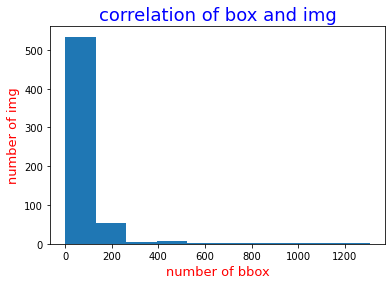

In [6]:
num_bbox= [len(data['bbox']) for data in all_dataset]
print('min bbox in one img:', np.min(num_bbox))
print('max bbox in one img:', np.max(num_bbox))
print()
print("Q1 quantile of arr:", np.quantile(num_bbox, .25))
print("Q2 quantile of arr:", np.quantile(num_bbox, .50))
print("Q3 quantile of arr:", np.quantile(num_bbox, .75))

plt.title('correlation of box and img', size= 18, color='b')
plt.xlabel('number of bbox', size= 13, color='r')
plt.ylabel('number of img', size= 13, color='r')
plt.hist(num_bbox)
plt.show()

# Number of bbox > 100

  6%|████▋                                                                            | 19/332 [00:05<01:35,  3.29it/s]

name: Data/train_img/image_00019.jpg


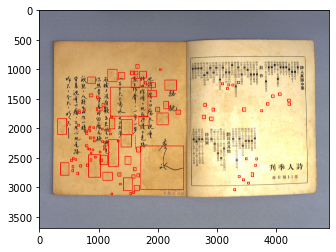

 10%|████████▎                                                                        | 34/332 [00:11<01:31,  3.27it/s]

name: Data/train_img/image_00034.jpg


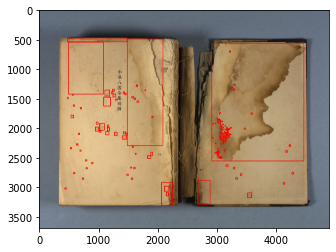

 11%|████████▌                                                                        | 35/332 [00:13<03:30,  1.41it/s]

name: Data/train_img/image_00035.jpg


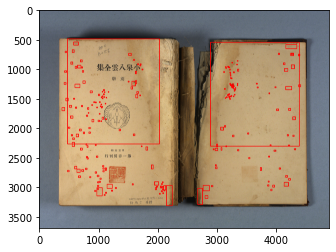

 11%|████████▊                                                                        | 36/332 [00:14<04:49,  1.02it/s]

name: Data/train_img/image_00036.jpg


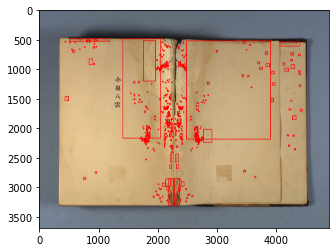

 11%|█████████                                                                        | 37/332 [00:16<05:44,  1.17s/it]

name: Data/train_img/image_00037.jpg


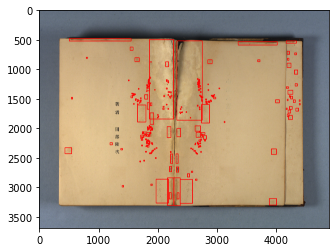

 11%|█████████▎                                                                       | 38/332 [00:18<06:24,  1.31s/it]

name: Data/train_img/image_00038.jpg


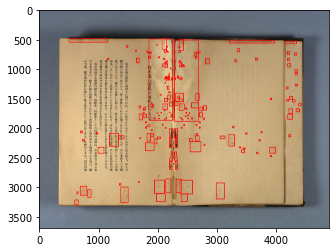

 12%|█████████▊                                                                       | 40/332 [00:20<05:12,  1.07s/it]

name: Data/train_img/image_00040.jpg


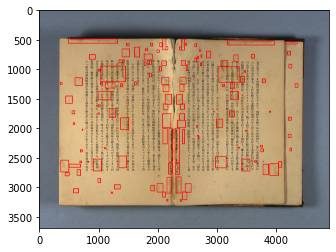

 13%|██████████▍                                                                      | 43/332 [00:22<03:41,  1.31it/s]

name: Data/train_img/image_00043.jpg


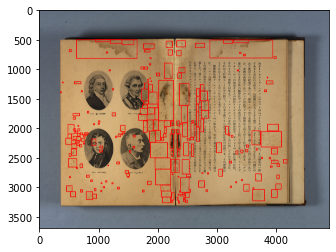

 13%|██████████▋                                                                      | 44/332 [00:23<04:53,  1.02s/it]

name: Data/train_img/image_00044.jpg


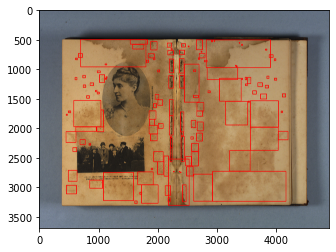

 14%|██████████▉                                                                      | 45/332 [00:25<05:43,  1.20s/it]

name: Data/train_img/image_00045.jpg


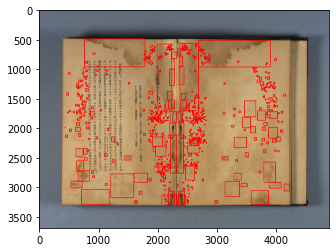

 14%|███████████▏                                                                     | 46/332 [00:27<06:18,  1.32s/it]

name: Data/train_img/image_00046.jpg


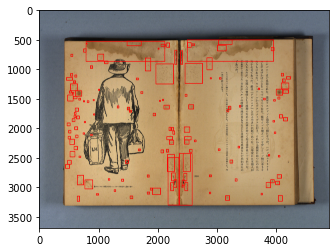

 15%|███████████▉                                                                     | 49/332 [00:29<03:59,  1.18it/s]

name: Data/train_img/image_00049.jpg


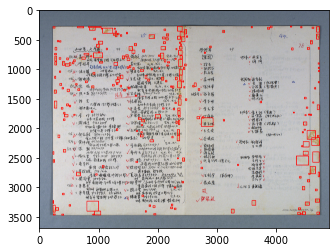

 15%|████████████▏                                                                    | 50/332 [00:30<05:06,  1.09s/it]

name: Data/train_img/image_00050.jpg


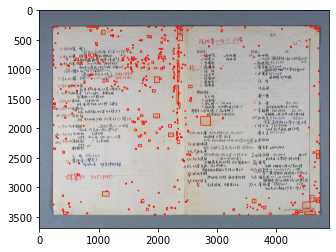

 18%|██████████████▉                                                                  | 61/332 [00:35<01:29,  3.03it/s]

name: Data/train_img/image_00061.jpg


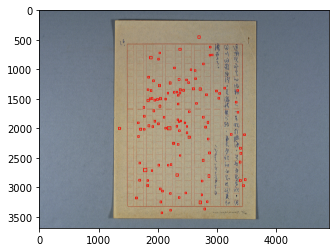

 21%|█████████████████▎                                                               | 71/332 [00:40<01:24,  3.10it/s]

name: Data/train_img/image_00071.jpg


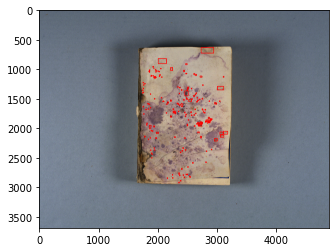

 24%|███████████████████▊                                                             | 81/332 [00:44<01:19,  3.17it/s]

name: Data/train_img/image_00081.jpg


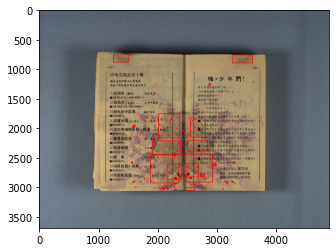

 25%|████████████████████                                                             | 82/332 [00:45<02:55,  1.42it/s]

name: Data/train_img/image_00082.jpg


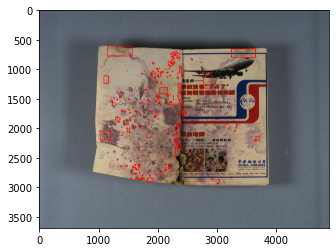

 25%|████████████████████▎                                                            | 83/332 [00:47<04:02,  1.03it/s]

name: Data/train_img/image_00083.jpg


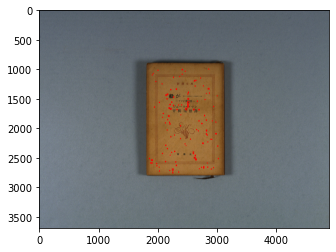

 25%|████████████████████▍                                                            | 84/332 [00:49<04:48,  1.16s/it]

name: Data/train_img/image_00084.jpg


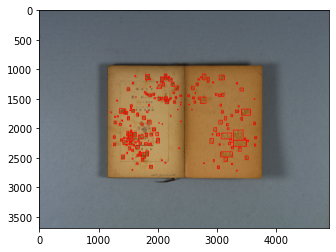

 26%|████████████████████▋                                                            | 85/332 [00:50<05:19,  1.29s/it]

name: Data/train_img/image_00085.jpg


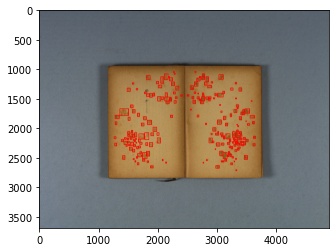

 30%|███████████████████████▉                                                         | 98/332 [00:55<01:13,  3.18it/s]

name: Data/train_img/image_00098.jpg


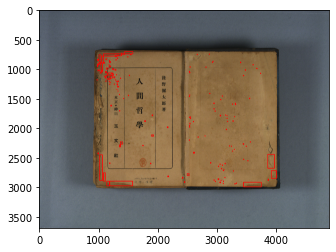

 30%|████████████████████████▏                                                        | 99/332 [00:57<02:52,  1.35it/s]

name: Data/train_img/image_00099.jpg


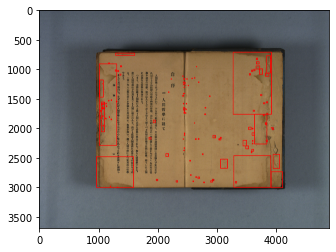

 31%|████████████████████████▌                                                       | 102/332 [00:59<02:27,  1.56it/s]

name: Data/train_img/image_00102.jpg


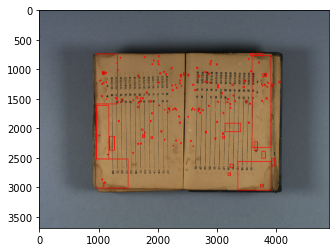

 31%|█████████████████████████                                                       | 104/332 [01:01<02:48,  1.35it/s]

name: Data/train_img/image_00104.jpg


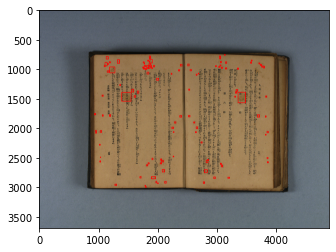

 32%|█████████████████████████▎                                                      | 105/332 [01:03<03:46,  1.00it/s]

name: Data/train_img/image_00105.jpg


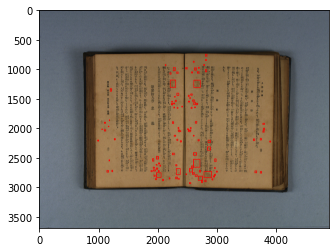

 33%|██████████████████████████▎                                                     | 109/332 [01:05<02:13,  1.68it/s]

name: Data/train_img/image_00109.jpg


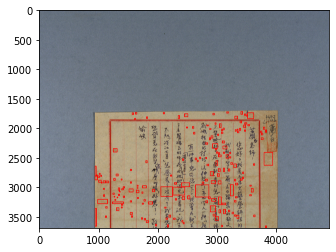

 33%|██████████████████████████▋                                                     | 111/332 [01:07<02:39,  1.39it/s]

name: Data/train_img/image_00111.jpg


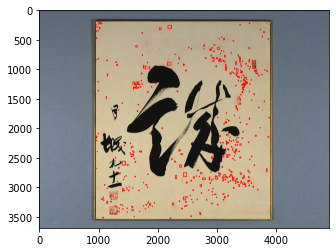

 34%|███████████████████████████▏                                                    | 113/332 [01:09<02:51,  1.28it/s]

name: Data/train_img/image_00113.jpg


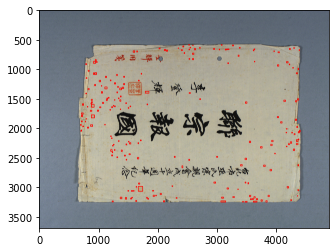

 35%|███████████████████████████▉                                                    | 116/332 [01:11<02:22,  1.52it/s]

name: Data/train_img/image_00116.jpg


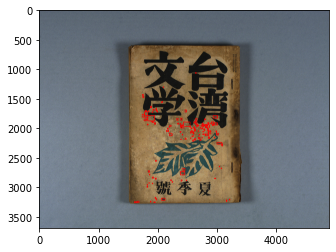

 35%|████████████████████████████▏                                                   | 117/332 [01:13<03:23,  1.06it/s]

name: Data/train_img/image_00117.jpg


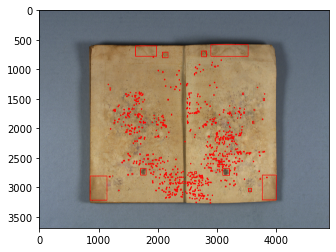

 39%|███████████████████████████████▎                                                | 130/332 [01:18<01:04,  3.13it/s]

name: Data/train_img/image_00130.jpg


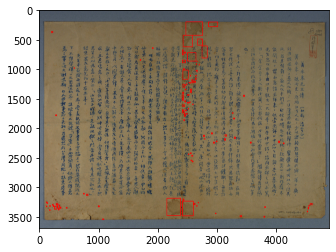

 40%|████████████████████████████████▎                                               | 134/332 [01:21<01:26,  2.29it/s]

name: Data/train_img/image_00134.jpg


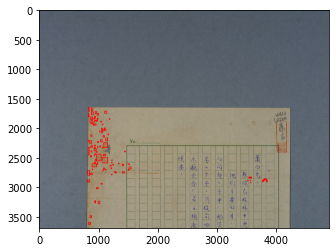

 41%|████████████████████████████████▊                                               | 136/332 [01:23<02:05,  1.56it/s]

name: Data/train_img/image_00136.jpg


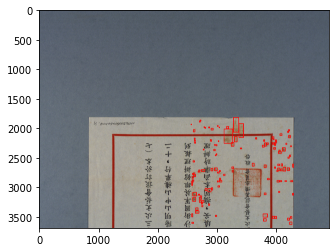

 42%|█████████████████████████████████▋                                              | 140/332 [01:25<01:38,  1.95it/s]

name: Data/train_img/image_00140.jpg


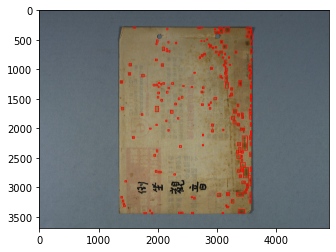

 42%|█████████████████████████████████▉                                              | 141/332 [01:27<02:40,  1.19it/s]

name: Data/train_img/image_00141.jpg


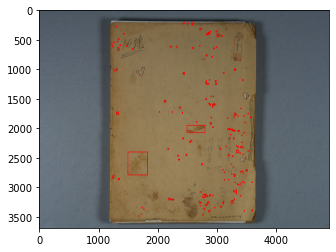

 43%|██████████████████████████████████▍                                             | 143/332 [01:29<02:39,  1.18it/s]

name: Data/train_img/image_00143.jpg


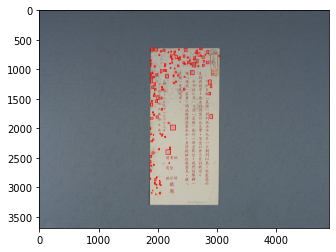

 43%|██████████████████████████████████▋                                             | 144/332 [01:30<03:22,  1.08s/it]

name: Data/train_img/image_00144.jpg


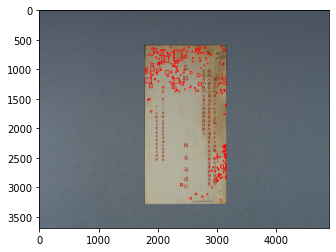

 44%|██████████████████████████████████▉                                             | 145/332 [01:32<03:50,  1.23s/it]

name: Data/train_img/image_00145.jpg


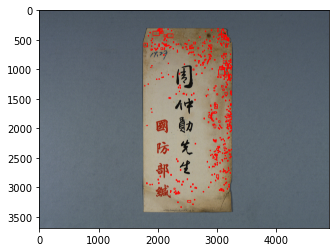

 44%|███████████████████████████████████▏                                            | 146/332 [01:34<04:10,  1.35s/it]

name: Data/train_img/image_00146.jpg


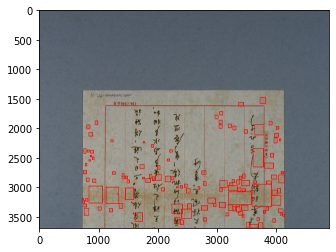

 46%|████████████████████████████████████▋                                           | 152/332 [01:37<01:27,  2.05it/s]

name: Data/train_img/image_00152.jpg


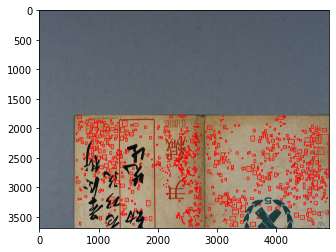

 46%|████████████████████████████████████▊                                           | 153/332 [01:38<02:34,  1.16it/s]

name: Data/train_img/image_00153.jpg


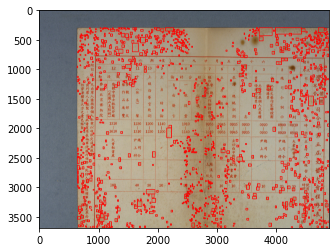

 48%|██████████████████████████████████████                                          | 158/332 [01:41<01:25,  2.04it/s]

name: Data/train_img/image_00158.jpg


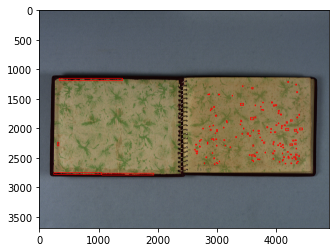

 52%|█████████████████████████████████████████▏                                      | 171/332 [01:46<00:49,  3.24it/s]

name: Data/train_img/image_00171.jpg


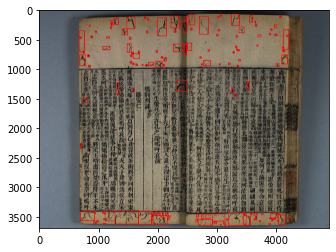

 52%|█████████████████████████████████████████▍                                      | 172/332 [01:48<01:51,  1.43it/s]

name: Data/train_img/image_00172.jpg


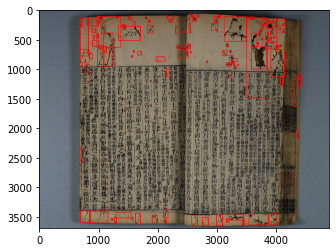

 53%|██████████████████████████████████████████▏                                     | 175/332 [01:50<01:38,  1.59it/s]

name: Data/train_img/image_00175.jpg


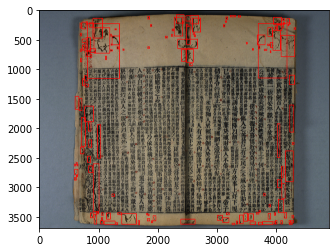

 57%|█████████████████████████████████████████████▎                                  | 188/332 [01:55<00:44,  3.23it/s]

name: Data/train_img/image_00188.jpg


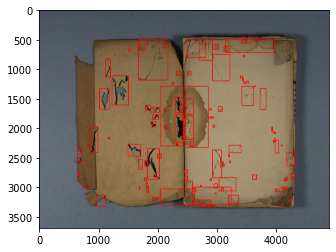

 58%|██████████████████████████████████████████████                                  | 191/332 [01:58<01:08,  2.05it/s]

name: Data/train_img/image_00191.jpg


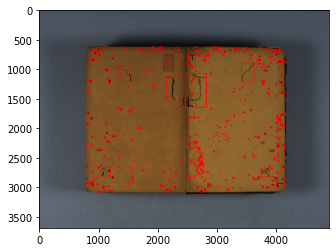

 58%|██████████████████████████████████████████████▎                                 | 192/332 [01:59<01:54,  1.23it/s]

name: Data/train_img/image_00192.jpg


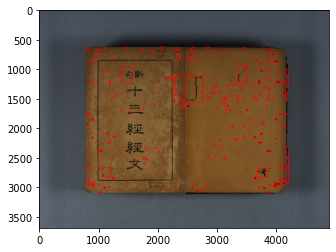

 58%|██████████████████████████████████████████████▌                                 | 193/332 [02:01<02:26,  1.05s/it]

name: Data/train_img/image_00193.jpg


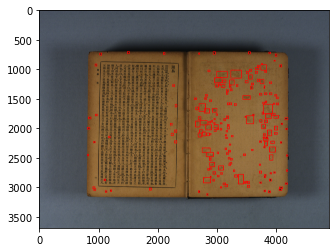

 58%|██████████████████████████████████████████████▋                                 | 194/332 [02:02<02:47,  1.21s/it]

name: Data/train_img/image_00194.jpg


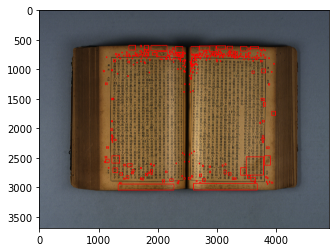

 59%|██████████████████████████████████████████████▉                                 | 195/332 [02:04<03:02,  1.33s/it]

name: Data/train_img/image_00195.jpg


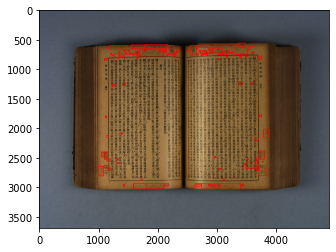

 59%|███████████████████████████████████████████████▍                                | 197/332 [02:06<02:25,  1.08s/it]

name: Data/train_img/image_00197.jpg


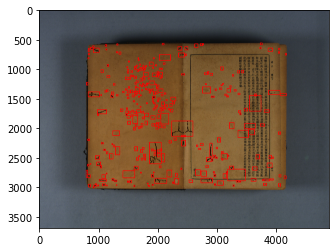

 60%|███████████████████████████████████████████████▋                                | 198/332 [02:07<02:44,  1.23s/it]

name: Data/train_img/image_00198.jpg


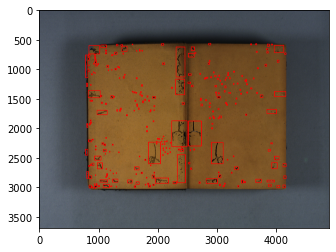

 60%|████████████████████████████████████████████████▏                               | 200/332 [02:09<02:15,  1.02s/it]

name: Data/train_img/image_00200.jpg


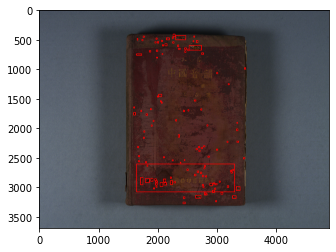

 61%|████████████████████████████████████████████████▍                               | 201/332 [02:11<02:36,  1.19s/it]

name: Data/train_img/image_00201.jpg


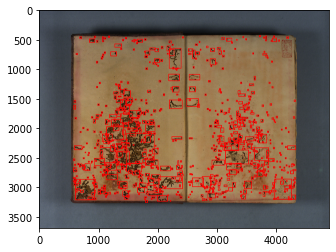

 61%|████████████████████████████████████████████████▋                               | 202/332 [02:13<02:51,  1.32s/it]

name: Data/train_img/image_00202.jpg


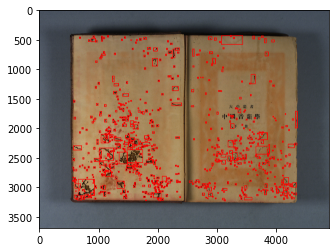

 61%|████████████████████████████████████████████████▉                               | 203/332 [02:14<03:00,  1.40s/it]

name: Data/train_img/image_00203.jpg


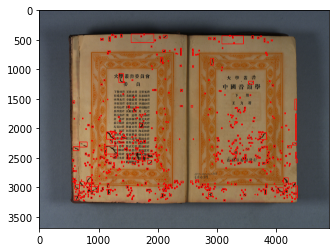

 61%|█████████████████████████████████████████████████▏                              | 204/332 [02:16<03:06,  1.46s/it]

name: Data/train_img/image_00204.jpg


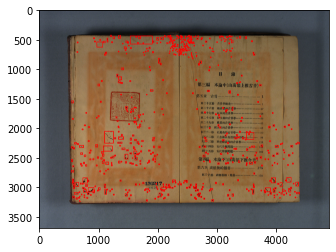

 62%|█████████████████████████████████████████████████▋                              | 206/332 [02:18<02:23,  1.14s/it]

name: Data/train_img/image_00206.jpg


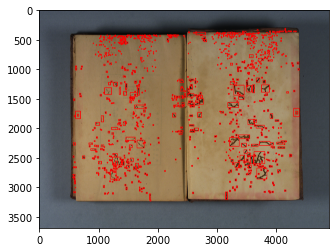

 62%|█████████████████████████████████████████████████▉                              | 207/332 [02:19<02:44,  1.31s/it]

name: Data/train_img/image_00207.jpg


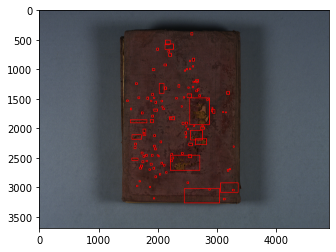

 63%|██████████████████████████████████████████████████▎                             | 209/332 [02:21<02:11,  1.07s/it]

name: Data/train_img/image_00209.jpg


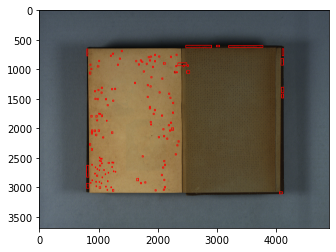

 64%|███████████████████████████████████████████████████▎                            | 213/332 [02:24<01:13,  1.63it/s]

name: Data/train_img/image_00213.jpg


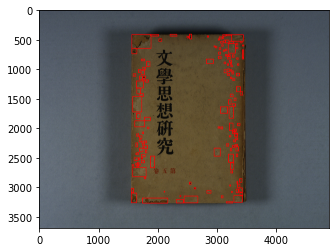

 64%|███████████████████████████████████████████████████▌                            | 214/332 [02:25<01:46,  1.11it/s]

name: Data/train_img/image_00214.jpg


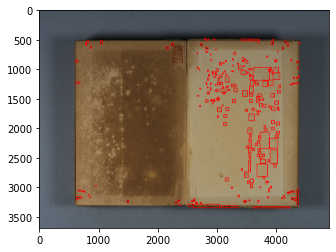

 65%|███████████████████████████████████████████████████▊                            | 215/332 [02:27<02:10,  1.12s/it]

name: Data/train_img/image_00215.jpg


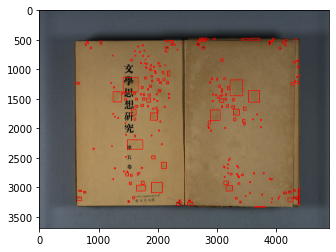

 65%|████████████████████████████████████████████████████                            | 216/332 [02:28<02:25,  1.26s/it]

name: Data/train_img/image_00216.jpg


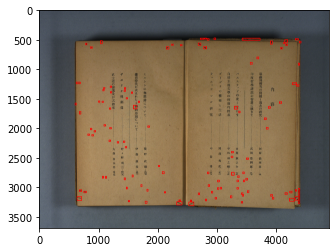

 66%|█████████████████████████████████████████████████████                           | 220/332 [02:31<01:14,  1.50it/s]

name: Data/train_img/image_00220.jpg


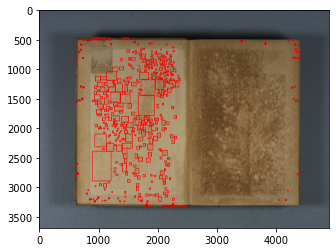

 67%|█████████████████████████████████████████████████████▍                          | 222/332 [02:33<01:22,  1.33it/s]

name: Data/train_img/image_00222.jpg


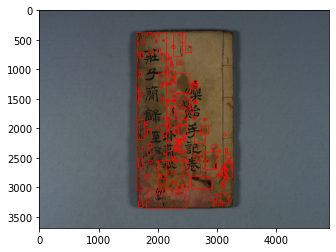

 67%|█████████████████████████████████████████████████████▉                          | 224/332 [02:35<01:25,  1.27it/s]

name: Data/train_img/image_00224.jpg


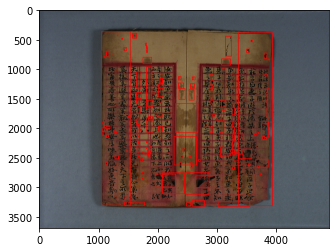

 68%|██████████████████████████████████████████████████████▏                         | 225/332 [02:36<01:49,  1.03s/it]

name: Data/train_img/image_00225.jpg


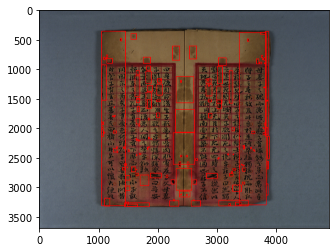

 68%|██████████████████████████████████████████████████████▍                         | 226/332 [02:38<02:07,  1.20s/it]

name: Data/train_img/image_00226.jpg


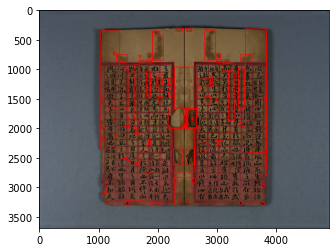

 68%|██████████████████████████████████████████████████████▋                         | 227/332 [02:40<02:17,  1.31s/it]

name: Data/train_img/image_00227.jpg


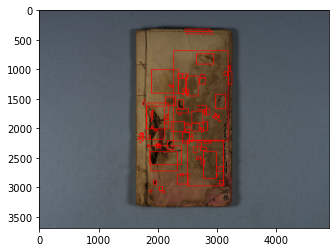

 69%|██████████████████████████████████████████████████████▉                         | 228/332 [02:41<02:25,  1.40s/it]

name: Data/train_img/image_00228.jpg


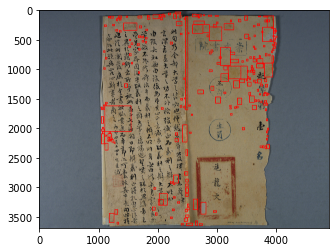

 69%|███████████████████████████████████████████████████████▏                        | 229/332 [02:43<02:30,  1.46s/it]

name: Data/train_img/image_00229.jpg


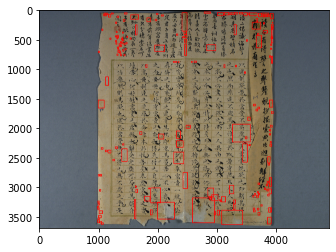

 69%|███████████████████████████████████████████████████████▍                        | 230/332 [02:44<02:33,  1.50s/it]

name: Data/train_img/image_00230.jpg


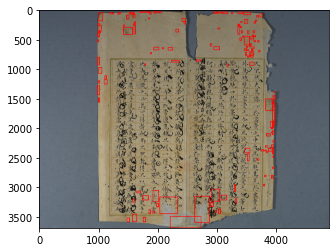

 70%|███████████████████████████████████████████████████████▉                        | 232/332 [02:46<01:56,  1.16s/it]

name: Data/train_img/image_00232.jpg


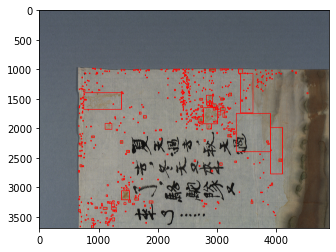

 70%|████████████████████████████████████████████████████████▏                       | 233/332 [02:48<02:08,  1.30s/it]

name: Data/train_img/image_00233.jpg


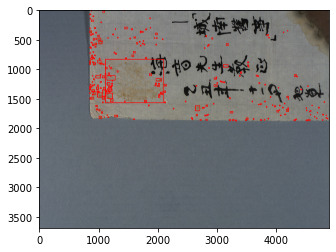

 70%|████████████████████████████████████████████████████████▍                       | 234/332 [02:49<02:16,  1.39s/it]

name: Data/train_img/image_00234.jpg


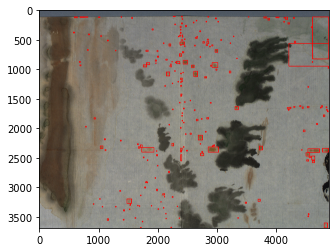

 71%|████████████████████████████████████████████████████████▋                       | 235/332 [02:51<02:20,  1.45s/it]

name: Data/train_img/image_00235.jpg


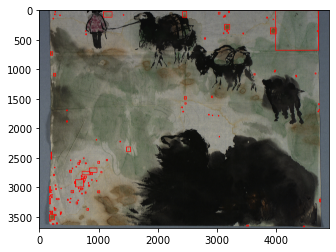

 71%|████████████████████████████████████████████████████████▊                       | 236/332 [02:53<02:26,  1.53s/it]

name: Data/train_img/image_00236.jpg


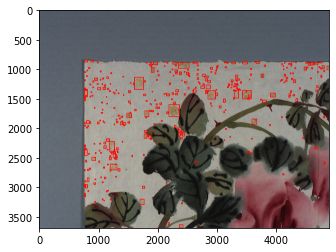

 71%|█████████████████████████████████████████████████████████                       | 237/332 [02:54<02:27,  1.55s/it]

name: Data/train_img/image_00237.jpg


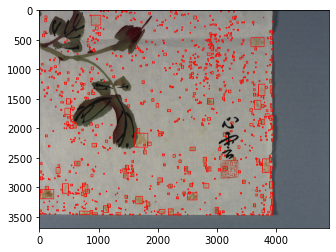

 72%|█████████████████████████████████████████████████████████▎                      | 238/332 [02:56<02:27,  1.57s/it]

name: Data/train_img/image_00238.jpg


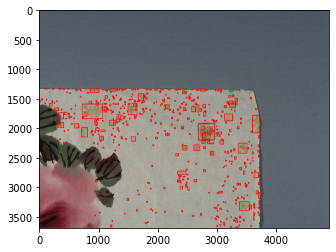

 73%|██████████████████████████████████████████████████████████                      | 241/332 [02:58<01:24,  1.08it/s]

name: Data/train_img/image_00241.jpg


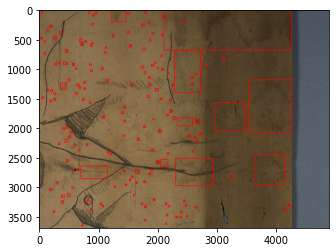

 77%|█████████████████████████████████████████████████████████████▍                  | 255/332 [03:04<00:22,  3.45it/s]

name: Data/train_img/image_00255.jpg


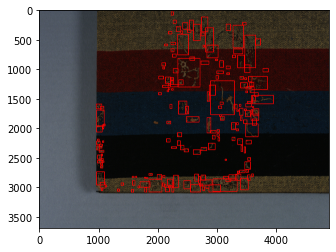

 78%|██████████████████████████████████████████████████████████████▍                 | 259/332 [03:06<00:30,  2.42it/s]

name: Data/train_img/image_00259.jpg


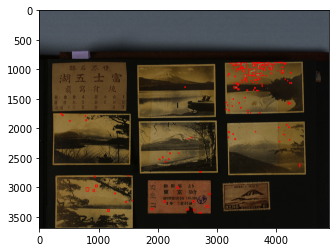

 79%|███████████████████████████████████████████████████████████████▎                | 263/332 [03:08<00:31,  2.16it/s]

name: Data/train_img/image_00263.jpg


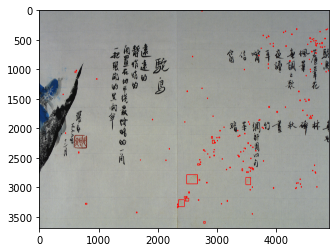

 83%|██████████████████████████████████████████████████████████████████▎             | 275/332 [03:13<00:17,  3.18it/s]

name: Data/train_img/image_00275.jpg


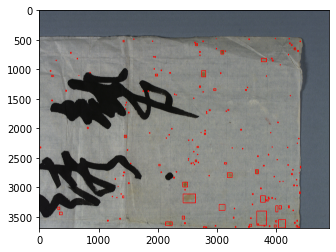

 83%|██████████████████████████████████████████████████████████████████▌             | 276/332 [03:15<00:39,  1.42it/s]

name: Data/train_img/image_00276.jpg


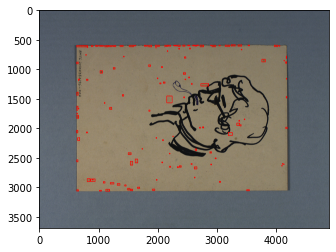

 87%|█████████████████████████████████████████████████████████████████████▍          | 288/332 [03:20<00:13,  3.23it/s]

name: Data/train_img/image_00288.jpg


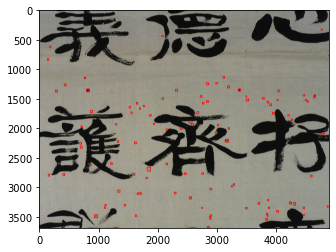

100%|████████████████████████████████████████████████████████████████████████████████| 332/332 [03:35<00:00,  1.54it/s]


In [17]:
import matplotlib.pyplot as plt

for i, data in enumerate(tqdm(all_dataset)):
    
    img= cv2.imread(data['image_path'])
    img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    bbox= data['bbox']
    bbox= np.array(bbox).astype(np.int)

    if len(bbox)>100:
        print('name:', data['image_path'])
        for box in bbox:
            cv2.rectangle(img,
                          (box[0], box[1]),
                          (box[2], box[3]),
                          (255, 0, 0), 10)
        plt.imshow(img)
        plt.show()

# Number of bbox < 10

  2%|█▏                                                                                | 5/332 [00:01<01:36,  3.41it/s]

name: ./Data/train_img_1/image_00005.jpg


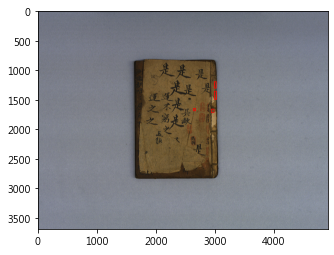

  3%|██▏                                                                               | 9/332 [00:03<02:21,  2.29it/s]

name: ./Data/train_img_1/image_00009.jpg


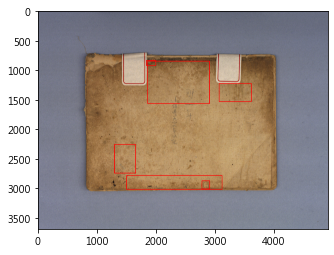

  5%|████▍                                                                            | 18/332 [00:07<01:41,  3.09it/s]

name: ./Data/train_img_1/image_00018.jpg


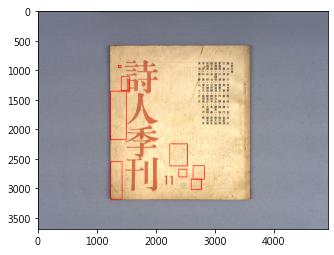

  6%|████▉                                                                            | 20/332 [00:09<03:01,  1.72it/s]

name: ./Data/train_img_1/image_00020.jpg


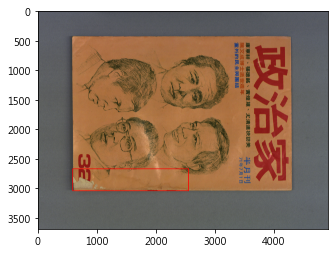

  6%|█████                                                                            | 21/332 [00:11<04:31,  1.14it/s]

name: ./Data/train_img_1/image_00021.jpg


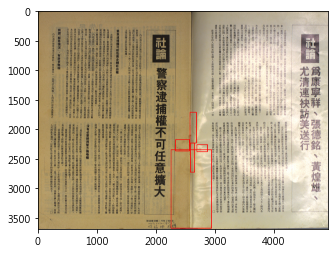

  9%|███████                                                                          | 29/332 [00:15<01:52,  2.69it/s]

name: ./Data/train_img_1/image_00029.jpg


  9%|███████                                                                          | 29/332 [00:15<02:46,  1.82it/s]


KeyboardInterrupt: 

In [34]:
import matplotlib.pyplot as plt

for i, data in enumerate(tqdm(all_dataset)):
    
    img= cv2.imread(data['image_path'])
    img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    bbox= data['bbox']
    bbox= np.array(bbox).astype(np.int)

    if len(bbox)<10:
        print('name:', data['image_path'])
        for box in bbox:
            cv2.rectangle(img,
                          (box[0], box[1]),
                          (box[2], box[3]),
                          (255, 0, 0), 10)
        plt.imshow(img)
        plt.show()

# Bbox W, H

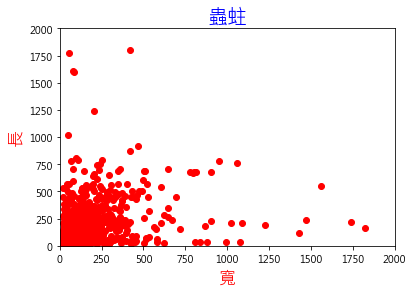

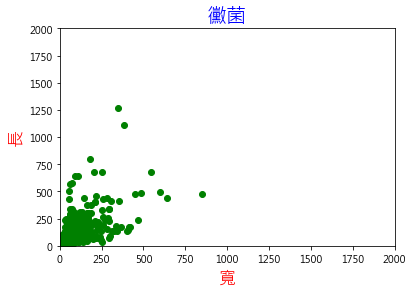

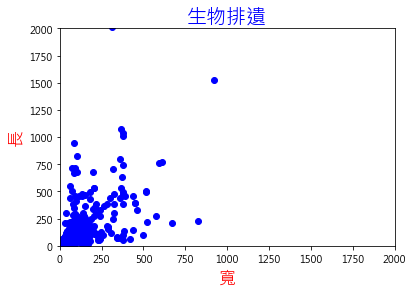

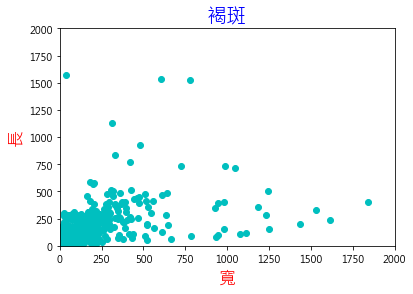

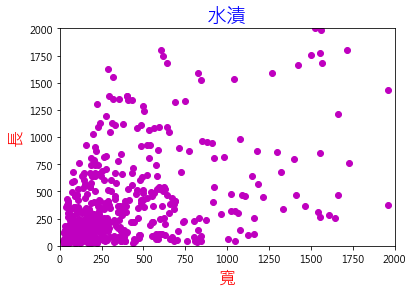

In [31]:
all_bbox= []
all_label= []
for data in all_dataset:
    all_bbox+= data['bbox']
    all_label+= data['label']

all_bbox= np.array(all_bbox)
all_label= np.array(all_label)
all_w= all_bbox[:,2]-all_bbox[:,0]
all_h= all_bbox[:,3]-all_bbox[:,1]

label= ['蟲蛀', '黴菌', '生物排遺', '褐斑', '水漬']
color= [
        'r',
        'g',
        'b',
        'c',
        'm',
    ]

plt.rcParams['font.sans-serif'] = ['Microsoft JhengHei'] 
plt.rcParams['axes.unicode_minus'] = False
for i in range(5):
    select_w= all_w[all_label==i+1]
    select_h= all_h[all_label==i+1]
    plt.scatter(select_w, select_h, color=color[i])
    plt.xlim(0,2000)
    plt.ylim(0,2000)
    plt.title(label[i], size=20, color='b')
    plt.xlabel('寬', size=17, color='r')
    plt.ylabel('長', size=17, color='r')
    plt.show()

# Area of bbox

min area in one img: 12.0
max area in one img: 13849371.0

Q1 quantile of arr: 238.0
Q2 quantile of arr: 575.0
Q3 quantile of arr: 1610.5


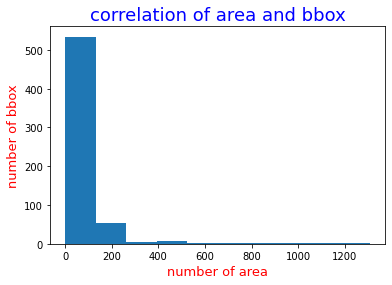

In [7]:
all_area= []

for data in all_dataset:
    bbox= np.array(data['bbox'])
    area= (bbox[:,2]-bbox[:,0]) * (bbox[:,3]-bbox[:,1])
    all_area+= area.tolist()

print('min area in one img:', np.min(all_area))
print('max area in one img:', np.max(all_area))
print()
print("Q1 quantile of arr:", np.quantile(all_area, .25))
print("Q2 quantile of arr:", np.quantile(all_area, .50))
print("Q3 quantile of arr:", np.quantile(all_area, .75))

plt.title('correlation of area and bbox', size= 18, color='b')
plt.xlabel('number of area', size= 13, color='r')
plt.ylabel('number of bbox', size= 13, color='r')
plt.hist(num_bbox)
plt.show()

In [25]:
for i in range(5):
    all_area= []
    print(f'class {i+1}:')
    for data in all_dataset:
        bbox= np.array(data['bbox'])
        label= np.array(data['label'])
        bbox= bbox[label==i+1]
        area= (bbox[:,2]-bbox[:,0]) * (bbox[:,3]-bbox[:,1])
        all_area+= area.tolist()

    print('min area in one img:', np.min(all_area))
    print('max area in one img:', np.max(all_area))
    print()
    print("Q1 quantile of arr:", np.quantile(all_area, .25))
    print("Q2 quantile of arr:", np.quantile(all_area, .50))
    print("Q3 quantile of arr:", np.quantile(all_area, .75))
    print()
    print()

class 1:
min area in one img: 42.0
max area in one img: 862680.0

Q1 quantile of arr: 420.0
Q2 quantile of arr: 837.0
Q3 quantile of arr: 2544.0


class 2:
min area in one img: 18.0
max area in one img: 441264.0

Q1 quantile of arr: 154.0
Q2 quantile of arr: 208.0
Q3 quantile of arr: 360.0


class 3:
min area in one img: 54.0
max area in one img: 2557140.0

Q1 quantile of arr: 204.0
Q2 quantile of arr: 1640.0
Q3 quantile of arr: 9638.0


class 4:
min area in one img: 16.0
max area in one img: 3310712.0

Q1 quantile of arr: 288.0
Q2 quantile of arr: 600.0
Q3 quantile of arr: 1280.0


class 5:
min area in one img: 576.0
max area in one img: 6002632.0

Q1 quantile of arr: 13857.0
Q2 quantile of arr: 44236.0
Q3 quantile of arr: 187748.5




# Area of bbox > 30000000

  2%|█▋                                                                                | 7/332 [00:02<01:39,  3.26it/s]

name: Data/train_img/image_00007.jpg


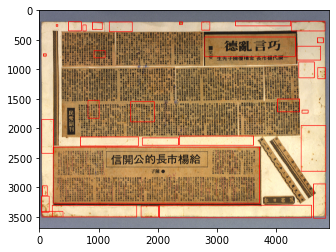

 10%|████████                                                                         | 33/332 [00:11<01:31,  3.25it/s]

name: Data/train_img/image_00033.jpg


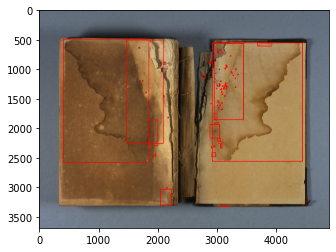

 10%|████████▎                                                                        | 34/332 [00:13<03:30,  1.42it/s]

name: Data/train_img/image_00034.jpg


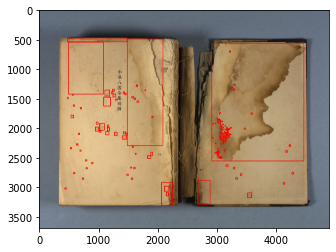

 74%|███████████████████████████████████████████████████████████▌                    | 247/332 [01:19<00:25,  3.31it/s]

name: Data/train_img/image_00247.jpg


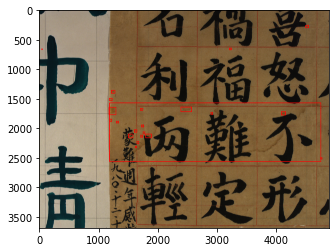

 82%|█████████████████████████████████████████████████████████████████▌              | 272/332 [01:28<00:18,  3.29it/s]

name: Data/train_img/image_00272.jpg


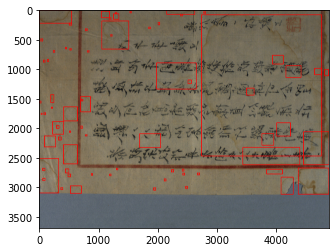

 96%|████████████████████████████████████████████████████████████████████████████▊   | 319/332 [01:44<00:04,  3.21it/s]

name: Data/train_img/image_00319.jpg


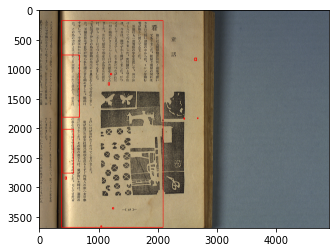

 96%|█████████████████████████████████████████████████████████████████████████████   | 320/332 [01:45<00:08,  1.41it/s]

name: Data/train_img/image_00320.jpg


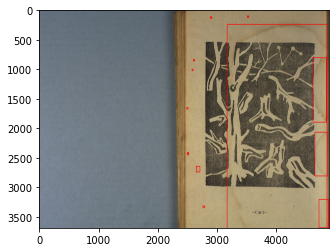

 99%|███████████████████████████████████████████████████████████████████████████████▎| 329/332 [01:49<00:01,  2.89it/s]

name: Data/train_img/image_00329.jpg


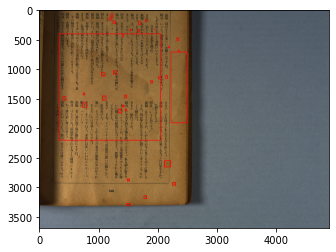

100%|████████████████████████████████████████████████████████████████████████████████| 332/332 [01:52<00:00,  2.96it/s]


In [14]:
import matplotlib.pyplot as plt

for i, data in enumerate(tqdm(all_dataset)):
    
    img= cv2.imread(data['image_path'])
    img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    bbox= data['bbox']
    bbox= np.array(bbox).astype(np.int)
    
    area= (bbox[:,2]-bbox[:,0]) * (bbox[:,3]-bbox[:,1])
    region= 3000000

    if (area>region).any():
        print('name:', data['image_path'])
        for box in bbox:
            cv2.rectangle(img,
                          (box[0], box[1]),
                          (box[2], box[3]),
                          (255, 0, 0), 10)
        plt.imshow(img)
        plt.show()

# Classes of bbox

Type 1: 11628
Type 2: 8597
Type 3: 1808
Type 4: 22970
Type 5: 677


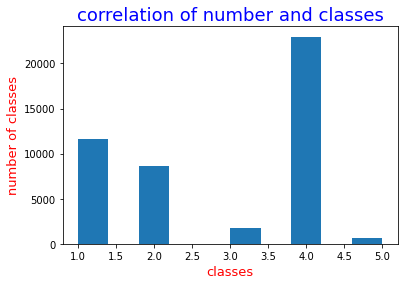

In [8]:
all_classes= []
for data in all_dataset:
    all_classes+= list(data['label'])

for c in sorted(list(set(all_classes))):
    print('Type {}:'.format(c), all_classes.count(c))

plt.title('correlation of number and classes', size= 18, color='b')
plt.xlabel('classes', size= 13, color='r')
plt.ylabel('number of classes', size= 13, color='r')
plt.hist(all_classes)
plt.show()

# Bbox with classes

  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

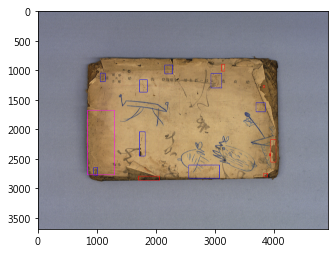

 33%|████████████████████████████                                                        | 1/3 [00:01<00:03,  1.57s/it]

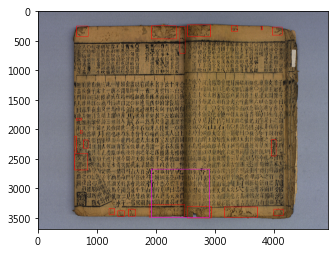

 67%|████████████████████████████████████████████████████████                            | 2/3 [00:03<00:01,  1.56s/it]

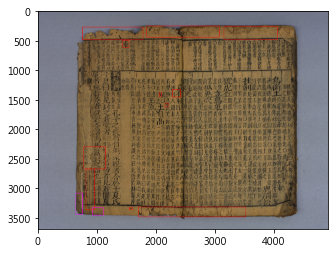

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:04<00:00,  1.57s/it]


In [33]:
import matplotlib.pyplot as plt

color= [
    (255, 0, 0), #紅
    (0, 255, 0), #綠
    (0, 0, 255), #藍
    (255, 97, 0), #澄
    (255, 0, 255), #紫
]

for data in tqdm(all_dataset[:3]):
    
    name= data['image_path']
    img= cv2.imread(name)
    img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    label= data['label']
    bbox= data['bbox']
    bbox= np.array(bbox).astype(np.int)

    for i, box in enumerate(bbox):
        cv2.rectangle(img,
                      (box[0], box[1]),
                      (box[2], box[3]),
                      color[label[i]-1], 5)
    
    plt.imshow(img)
    plt.show()
    img= cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
#     cv2.imwrite('Data/train_img_with_label/{}'.format('_'.join(name.split('/')[-2:])), img)

# Augmentation

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:04<00:00,  1.81it/s]


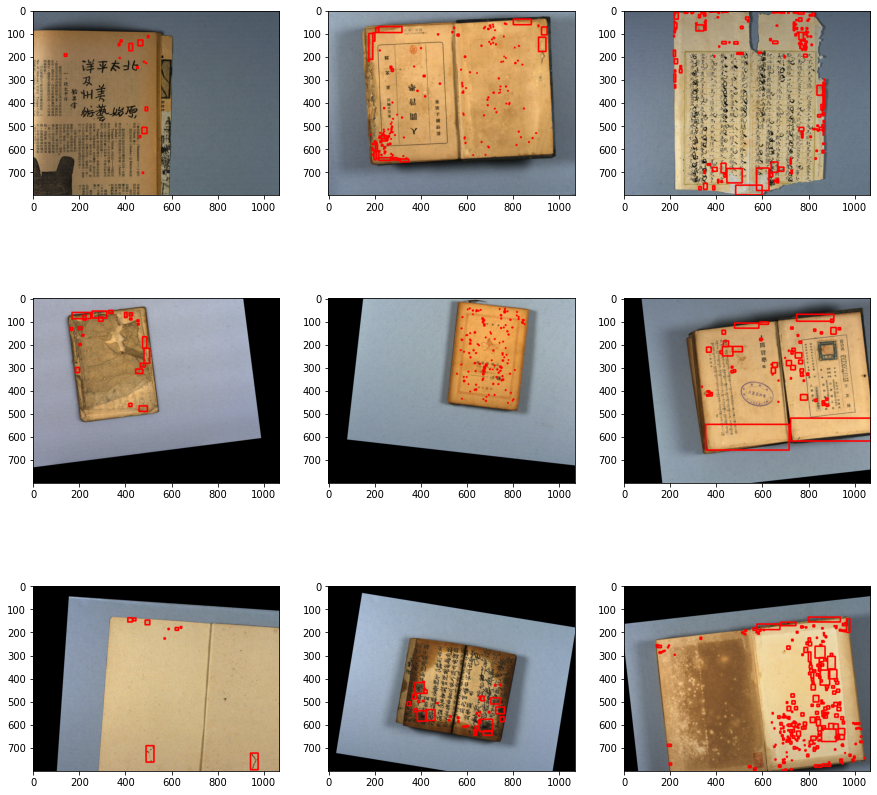

In [31]:
import albumentations as A
import cv2
import numpy as np
np.random.seed(123)

def get_train_transform(img_size):
    return A.Compose([
        A.SmallestMaxSize (max_size=img_size, interpolation=1, p=1),
        #A.RandomCrop(height= img_size, width= img_size, p=1),
        #A.RandomResizedCrop(img_size, img_size, scale=(0.85, 1.0), p=1),
        #A.Resize(height= img_size, width= img_size, p=1),
        #A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
        #A.GaussNoise(var_limit=(0.1, 0.1), mean=0, p=0.5),
        A.VerticalFlip(p=0.5),
        A.HorizontalFlip(p=0.5),
        A.Blur(blur_limit=2, p=0.5),
        A.ShiftScaleRotate(shift_limit=0.2, scale_limit=0.2, rotate_limit=10,
                                        interpolation=cv2.INTER_LINEAR, border_mode=0, p=0.7),
        #A.Transpose(p=0.5),
        #A.CoarseDropout(max_holes=8, max_height= int(img_size/10), max_width=int(img_size/10), fill_value=0, p=0.5),
        #A.ElasticTransform(alpha_affine=30, border_mode=1, p=0.5),
        #A.HueSaturationValue(hue_shift_limit=0.2, sat_shift_limit=0.2, val_shift_limit=0.2, p=0.5),
        #A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=1.0, p=1),
        #A.Normalize(mean=[0.449, 0.426, 0.388], std=[0.135, 0.110, 0.109], max_pixel_value=1.0, p=1),
    ],bbox_params=A.BboxParams(format= 'pascal_voc', label_fields=['labels']))

aug= get_train_transform(800)
choose_img= np.random.choice(all_dataset, 9)

plt.figure(figsize= (15,15))
for i, name in enumerate(tqdm(choose_img)):
    name= choose_img[i]['image_path']
    img= cv2.imread(name)
    img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)/255
    bbox= choose_img[i]['bbox']
    transform= aug(image= img, bboxes= bbox, labels= np.ones(len(bbox)))
    img= transform['image']
    bbox= transform['bboxes']
    bbox= np.array(bbox).astype(np.int)
    
    plt.subplot(3,3,i+1)
    img= img-img.min()
    img/= img.max()
    img= img*255
    
    for j in range(len(bbox)):
        cv2.rectangle(img,
                      (bbox[j][0], bbox[j][1]),
                      (bbox[j][2], bbox[j][3]),
                      (255, 0, 0), 5)
        
    plt.imshow(img.astype(np.uint8))
plt.show()